In [2]:
%matplotlib inline


# Vocal separation


This notebook demonstrates a simple technique for separating vocals (and
other sporadic foreground signals) from accompanying instrumentation.

This is based on the "REPET-SIM" method of `Rafii and Pardo, 2012
<http://www.cs.northwestern.edu/~zra446/doc/Rafii-Pardo%20-%20Music-Voice%20Separation%20using%20the%20Similarity%20Matrix%20-%20ISMIR%202012.pdf>`_, but includes a couple of modifications and extensions:

    - FFT windows overlap by 1/4, instead of 1/2
    - Non-local filtering is converted into a soft mask by Wiener filtering.
      This is similar in spirit to the soft-masking method used by `Fitzgerald, 2012
      <http://arrow.dit.ie/cgi/viewcontent.cgi?article=1086&context=argcon>`_,
      but is a bit more numerically stable in practice.



In [3]:
# Code source: Brian McFee
# License: ISC

##################
# Standard imports
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt
import librosa

import librosa.display

Load an example with vocals.



In [15]:
!wget -q https://github.com/librosa/librosa_gallery/blob/master/audio/Cheese_N_Pot-C_-_16_-_The_Raps_Well_Clean_Album_Version.mp3

In [29]:
!pip install ffprobe

  Created wheel for ffprobe: filename=ffprobe-0.5-cp37-none-any.whl size=3432 sha256=c30a9b5bf4616768bb813e37a88d2696c1eb98c16263b74a28910719f8cfa79b
  Stored in directory: /root/.cache/pip/wheels/a0/fe/3b/8af08ae1cdfc27e226779e2cb1a7c8a2ba4954c05c562cdc77
Successfully built ffprobe


In [30]:
!python ffprobe.py -i /content/Test_recording_with_noise.wav

File:       /content/Test_recording_with_noise.wav
Json: 
 {
    "streams": [
        {
            "index": 0,
            "codec_name": "pcm_s16le",
            "codec_long_name": "PCM signed 16-bit little-endian",
            "codec_type": "audio",
            "codec_time_base": "1/16000",
            "codec_tag_string": "[1][0][0][0]",
            "codec_tag": "0x0001",
            "sample_fmt": "s16",
            "sample_rate": "16000",
            "channels": 2,
            "bits_per_sample": 16,
            "r_frame_rate": "0/0",
            "avg_frame_rate": "0/0",
            "time_base": "1/16000",
            "duration_ts": 159744,
            "duration": "9.984000",
            "bit_rate": "512000",
            "disposition": {
                "default": 0,
                "dub": 0,
                "original": 0,
                "comment": 0,
                "lyrics": 0,
                "karaoke": 0,
                "forced": 0,
                "hearing_impaired": 0,
      

In [31]:
y, sr = librosa.load('/content/Test_recording_with_noise.wav', sr=16000 )


# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

Plot a 5-second slice of the spectrum



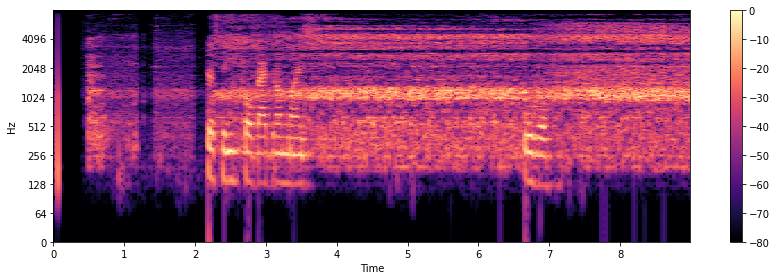

In [32]:
idx = slice(*librosa.time_to_frames([0, 9], sr=sr))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

The wiggly lines above are due to the vocal component.
Our goal is to separate them from the accompanying
instrumentation.




In [33]:
# We'll compare frames using cosine similarity, and aggregate similar frames
# by taking their (per-frequency) median value.
#
# To avoid being biased by local continuity, we constrain similar frames to be
# separated by at least 2 seconds.
#
# This suppresses sparse/non-repetetitive deviations from the average spectrum,
# and works well to discard vocal elements.

S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))

# The output of the filter shouldn't be greater than the input
# if we assume signals are additive.  Taking the pointwise minimium
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter)

The raw filter output can be used as a mask,
but it sounds better if we use soft-masking.



In [34]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i, margin_v = 2, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

Plot the same slice, but separated into its foreground and background



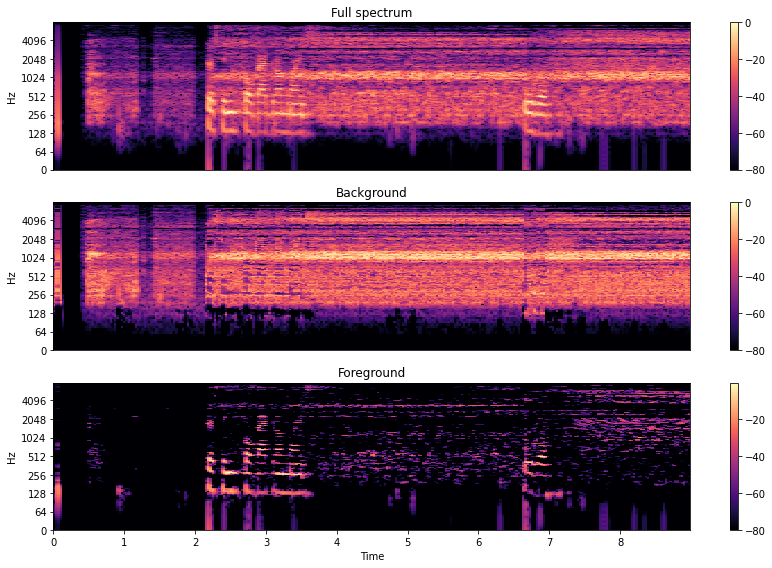

In [35]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background[:, idx], ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [36]:
reconstructed_audio = librosa.istft(S_foreground)

In [37]:
import soundfile as sf
sf.write('test_with_noise_vocal_separated.wav', reconstructed_audio, 16000, 'PCM_16')

In [39]:
import IPython
IPython.display.Audio('/content/Test_recording_with_noise.wav')

In [41]:
IPython.display.Audio('/content/test_with_noise_vocal_separated.wav')

In [44]:
IPython.display.Audio('/content/Cheese_N_Pot-C_-_16_-_The_Raps_Well_Clean_Album_Version.mp3')

In [43]:
!wget -c -A '*.mp3' -r -l 1 -nd https://github.com/librosa/librosa_gallery/blob/master/audio/Cheese_N_Pot-C_-_16_-_The_Raps_Well_Clean_Album_Version.mp3

--2021-06-25 10:26:09--  https://github.com/librosa/librosa_gallery/blob/master/audio/Cheese_N_Pot-C_-_16_-_The_Raps_Well_Clean_Album_Version.mp3
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘Cheese_N_Pot-C_-_16_-_The_Raps_Well_Clean_Album_Version.mp3’

Cheese_N_Pot-C_-_16     [ <=>                ] 106.71K  --.-KB/s    in 0.009s  

2021-06-25 10:26:09 (11.7 MB/s) - ‘Cheese_N_Pot-C_-_16_-_The_Raps_Well_Clean_Album_Version.mp3’ saved [109270]

Loading robots.txt; please ignore errors.
--2021-06-25 10:26:09--  https://github.com/robots.txt
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 1481 (1.4K) [text/plain]
Saving to: ‘robots.txt.tmp’

robots.txt.tmp      100%[===================>]   1.45K  --.-KB/s    in 0s      

2021-06-25 10:26:09 (41.1 MB/s) - ‘robots.txt.tmp’ sav